# Identify start - end attack

## Keypoints loading

In [1]:
import json
import os
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import ipywidgets as widgets
from ipywidgets import interactive


%matplotlib inline

In [2]:
df = pd.read_csv('../data/Kaggle/ClipDescriptorKaggle.csv')
df["start"] = 0
df["end"] = 0
df["who"] = 0

In [3]:
df.head()

,id,ClipName,URL,Start_frame,End_frame,Light1,Light2,Hit_label,start,end,who
0,1,0001_002_00_01_1,https://www.youtube.com/watch?v=uho2ldovj7o,22750.0,22825.0,2,2,0-0-1,0,0,0
1,2,0001_002_00_02_1,https://www.youtube.com/watch?v=uho2ldovj7o,24684.0,24759.0,2,2,1-0-0,0,0,0
2,3,0001_002_01_01_1,https://www.youtube.com/watch?v=uho2ldovj7o,27330.0,27405.0,2,1,1-0-0,0,0,0
3,4,0001_002_01_02_1,https://www.youtube.com/watch?v=uho2ldovj7o,28051.0,28126.0,2,2,0-0-1,0,0,0
4,5,0001_002_02_02_1,https://www.youtube.com/watch?v=uho2ldovj7o,34040.0,34115.0,2,2,0-0-1,0,0,0


In [4]:
print("{} different clips".format(len(df.ClipName.unique())))

9370 different clips


In [5]:
def load_key_point(path):
    with open(path, 'r') as fh:
        df_kp = json.load(fh)
    res = [np.array(el) for el in df_kp]
    return [el for el in res] #  if el.ndim == 3

df_kp = load_key_point('../data/Kaggle/FencersKeyPoints/0006_028_00_04_1.json')

## Load video clip

(-0.5, 639.5, 359.5, -0.5)

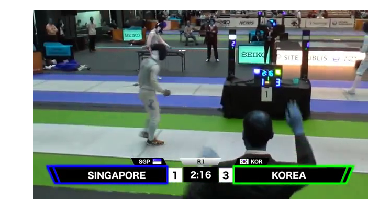

In [6]:
import cv2

def load_video():
    cap = cv2.VideoCapture('../data/video.mp4')
    return cap

def get_frame_from_video(frame_number):
    # Set frame position
    cap.set(cv2.CAP_PROP_POS_FRAMES, frame_number)
    ret, frame = cap.read()
    return frame

frame = get_frame_from_video(22850)
plt.imshow(frame)
plt.axis("off")

## Visualize

In [7]:
def plot_key_points(X, ax):
    mask = X[0].mean(axis=1) > 1
    ax.plot(X[0][mask, 0], X[0][mask, 1], 'ro')
    mask = X[1].mean(axis=1) > 1
    ax.plot(X[1][mask, 0], X[1][mask, 1], 'bo')
    ax.set_ylim(230, 0)
    
def plot_key_point_sequence(idx):
    fig, ax = plt.subplots()
    plot_key_points(df_kp[int(idx)], ax)
    plt.show()


interactive_plot = interactive(plot_key_point_sequence, idx=(0, len(df_kp)-1))
output = interactive_plot.children[-1]
output.layout.height = '350px'
interactive_plot

interactive(children=(IntSlider(value=37, description='idx', max=74), Output(layout=Layout(height='350px'))), …

## Display all images of same clip

In [18]:
def plot_key_points(X, ax):
    mask = X[0].mean(axis=1) > 1
    ax.plot(X[0][mask, 0], X[0][mask, 1], 'ro')
    mask = X[1].mean(axis=1) > 1
    ax.plot(X[1][mask, 0], X[1][mask, 1], 'bo')
    ax.set_ylim(230, 0)


def plot_all_from_clip(df_kp, start, axs):
    idx = 0
    for row in range(N_row):
        for col in range(N_col):
            ax = axs[row][col]
            try:
                ax.imshow(get_frame_from_video(int(start + idx)))
                plot_key_points(df_kp[idx], ax)
                ax.set_aspect("equal")
                #ax.set_title(str(idx), loc="center")
                #ax.set_axis("off")
                ax.text(.9,.8,str(idx),
                        color="white", size=20, fontweight="bold",
                        horizontalalignment='center',
                        transform=ax.transAxes)
            except Exception as e:
                print(e)
                pass
            idx += 1
    plt.tight_layout()
    plt.show()
            
def setup_figure(N_row=25, N_col=3, fig_width=20, fig_height=50):
    f, axs = plt.subplots(N_row, N_col, sharex='col', sharey='row',
                          gridspec_kw={'hspace': 0, 'wspace': 0},
                          constrained_layout=True)
    
    f.set_figwidth(20)
    f.set_figheight(50)
    return axs

0001_002_00_01_1
22750.0
22825.0
'list' object has no attribute 'mean'
'list' object has no attribute 'mean'
'list' object has no attribute 'mean'
'list' object has no attribute 'mean'


/usr/local/lib/python3.7/site-packages/matplotlib/figure.py:2144: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  warnings.warn("This figure was using constrained_layout==True, "


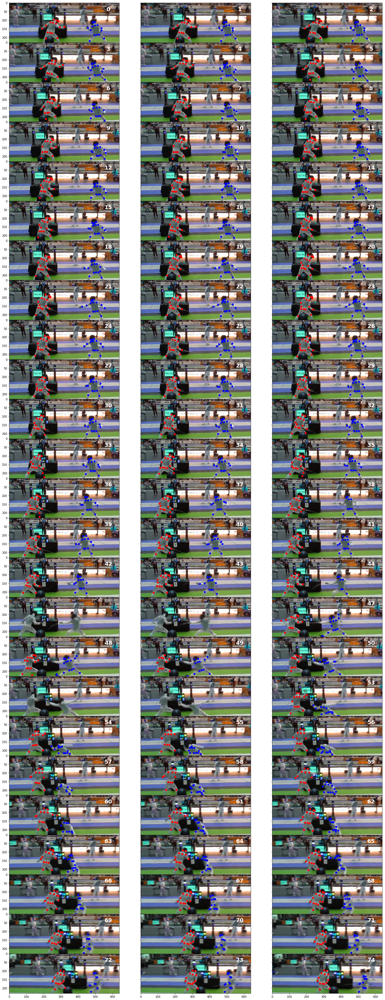

idx of start attack ?44
idx of end attack ?55
who initiates attack ? (left or right)right
0001_002_00_02_1
24684.0
24759.0
'list' object has no attribute 'mean'
'list' object has no attribute 'mean'
'list' object has no attribute 'mean'
'list' object has no attribute 'mean'


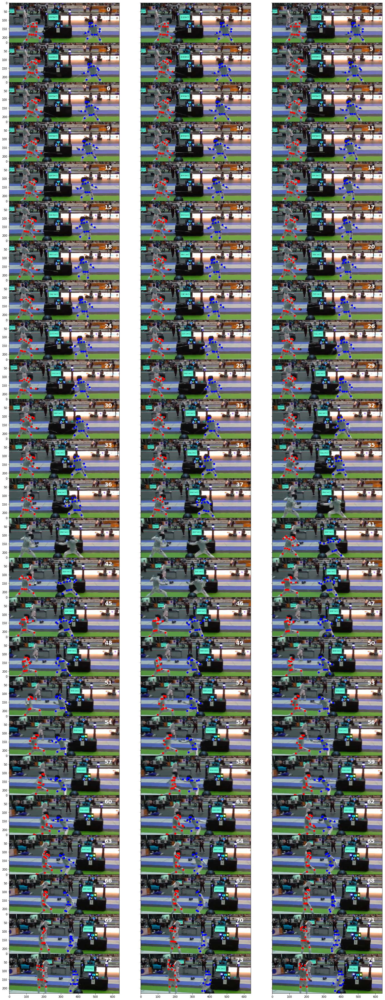

idx of start attack ?44
idx of end attack ?55


KeyboardInterrupt: 

In [19]:
N_col = 3
N_row = 25
    
for clip_idx, clipname in enumerate(df.ClipName.unique()):
    print(clipname)
    
    start = df[df.ClipName == clipname]["Start_frame"].values[0]
    end = df[df.ClipName == clipname]["End_frame"].values[0]
    print(start)
    print(end)
    
    df_kp = load_key_point('../data/Kaggle/FencersKeyPoints/{}.json'.format(clipname))
    
    setup_figure()
    
    plot_all_from_clip(df_kp, start, axs)
    
    start = input("idx of start attack ?")
    end = input("idx of end attack ?")
    who = input("who initiates attack ? (left or right)")
    df.loc[clip_idx, "start"] = int(start)
    df.loc[clip_idx, "end"] = int(end)
    df.loc[clip_idx, "who"] = who.lower()

In [11]:
df.head()

,id,ClipName,URL,Start_frame,End_frame,Light1,Light2,Hit_label,start,end,who
0,1,0001_002_00_01_1,https://www.youtube.com/watch?v=uho2ldovj7o,22750.0,22825.0,2,2,0-0-1,44,55,right
1,2,0001_002_00_02_1,https://www.youtube.com/watch?v=uho2ldovj7o,24684.0,24759.0,2,2,1-0-0,0,0,0
2,3,0001_002_01_01_1,https://www.youtube.com/watch?v=uho2ldovj7o,27330.0,27405.0,2,1,1-0-0,0,0,0
3,4,0001_002_01_02_1,https://www.youtube.com/watch?v=uho2ldovj7o,28051.0,28126.0,2,2,0-0-1,0,0,0
4,5,0001_002_02_02_1,https://www.youtube.com/watch?v=uho2ldovj7o,34040.0,34115.0,2,2,0-0-1,0,0,0
